In [1]:
from keras_retinanet.models import load_model, convert_model
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os


import tensorflow.contrib.tensorrt as trt
from tensorflow.python.platform import gfile

In [3]:
model = load_model('convert/resnet_50_coco_gvi.h5', backbone_name='resnet50')

Using TensorFlow backend.
W0916 05:37:46.074117 140391527069504 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:541: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0916 05:37:46.105729 140391527069504 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4409: The name tf.random_normal is deprecated. Please use tf.random.normal instead.

W0916 05:37:46.193941 140391527069504 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4432: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0916 05:37:46.209196 140391527069504 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:2139: The name tf.nn.fused_batch_norm is deprecated. Please use tf.compat.v1.nn.fused_batch_norm instead.

W0916 05:37:46.212082

In [2]:
tf.keras.backend.set_learning_phase(0)

In [7]:
MODEL_PATH = "TRT"

# save the model to tensorflow
saver=tf.train.Saver()
sess =tf.keras.backend.get_session()
sess.run(tf.global_variables_initializer())
save_path=saver.save(sess,MODEL_PATH+'/Project_data_new')
print("keras model sucessfully converted to tf"+MODEL_PATH)

keras model sucessfully converted to tfTRT


In [8]:
model.summary()

Model: "retinanet-bbox"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9408        input_1[0][0]                    
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
conv1_relu (Activation)         (None, None, None, 6 0           bn_conv1[0][0]                   
_____________________________________________________________________________________

In [9]:
name1 =[node.op.name for node in model.outputs]
print(model.get_layer('filtered_detections').output)
print(name1)

[<tf.Tensor 'filtered_detections/map/TensorArrayStack/TensorArrayGatherV3:0' shape=(?, 300, 4) dtype=float32>, <tf.Tensor 'filtered_detections/map/TensorArrayStack_1/TensorArrayGatherV3:0' shape=(?, 300) dtype=float32>, <tf.Tensor 'filtered_detections/map/TensorArrayStack_2/TensorArrayGatherV3:0' shape=(?, 300) dtype=int32>]
['filtered_detections/map/TensorArrayStack/TensorArrayGatherV3', 'filtered_detections/map/TensorArrayStack_1/TensorArrayGatherV3', 'filtered_detections/map/TensorArrayStack_2/TensorArrayGatherV3']


In [ ]:
tf.enable_resource_variables()
with tf.Session(config=tf.ConfigProto(gpu_options=tf.GPUOptions(per_process_gpu_memory_fraction=0.50))) as sess:
    saver = tf.train.import_meta_graph("TRT/Project_data.meta")
    saver.restore(sess, "TRT/Project_data")
    your_outputs = ['filtered_detections/map/TensorArrayStack/TensorArrayGatherV3', 
                    'filtered_detections/map/TensorArrayStack_1/TensorArrayGatherV3', 
                    'filtered_detections/map/TensorArrayStack_2/TensorArrayGatherV3']
    frozen_graph = tf.graph_util.convert_variables_to_constants(sess,tf.get_default_graph().as_graph_def(),
        output_node_names=your_outputs)
    with gfile.FastGFile("TRT/frozen_model_new.pb", 'wb') as f:
        f.write(frozen_graph.SerializeToString())
    print("Frozen model is successfully stored!")

In [9]:
# convert (optimize) frozen model to TensorRT model
trt_graph = trt.create_inference_graph(
    input_graph_def=frozen_graph,# frozen model
    outputs=your_outputs,
    max_batch_size=1000,# specify your max batch size
    max_workspace_size_bytes=3*(10**9),# specify the max workspace
    precision_mode="FP16") # precision, can be "FP32" (32 floating point precision) or "FP16"

#write the TensorRT model to be used later for inference
tf.enable_resource_variables()
with gfile.FastGFile("TRT/TensorRT_model_16.pb", 'wb') as f:
    f.write(trt_graph.SerializeToString())
print("TensorRT model is successfully stored!")

TensorRT model is successfully stored!


In [10]:
# check how many ops of the original frozen model
all_nodes = len([1 for n in frozen_graph.node])
print("numb. of all_nodes in frozen graph:", all_nodes)

# check how many ops that is converted to TensorRT engine
trt_engine_nodes = len([1 for n in trt_graph.node if str(n.op) == 'TRTEngineOp'])
print("numb. of trt_engine_nodes in TensorRT graph:", trt_engine_nodes)
all_nodes = len([1 for n in trt_graph.node])
print("numb. of all_nodes in TensorRT graph:", all_nodes)

numb. of all_nodes in frozen graph: 4823
numb. of trt_engine_nodes in TensorRT graph: 10
numb. of all_nodes in TensorRT graph: 4560


In [3]:
def read_pb_graph(model):
    with gfile.FastGFile(model,'rb') as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())
    return graph_def

In [4]:
paths = os.listdir('examples/5 img/')

In [5]:
for i in range(len(paths)):
    paths[i] = 'examples/5 img/'+ paths[i]

In [6]:
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

In [7]:
labels_to_names = {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microwave', 69: 'oven', 70: 'toaster', 71: 'sink', 72: 'refrigerator', 73: 'book', 74: 'clock', 75: 'vase', 76: 'scissors', 77: 'teddy bear', 78: 'hair drier', 79: 'toothbrush'}

Processing time per image -0:  2.4416236877441406


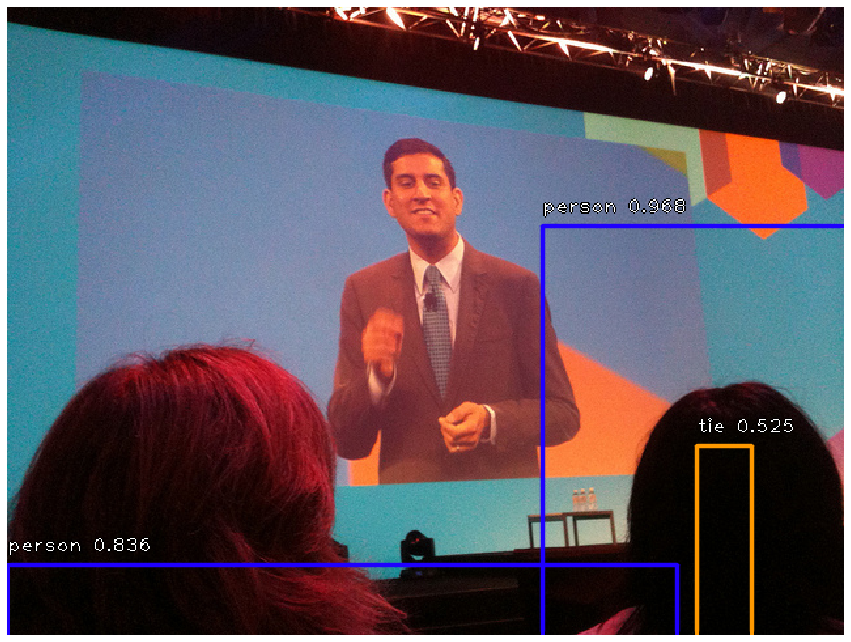

Processing time per image -1:  2.5646963119506836


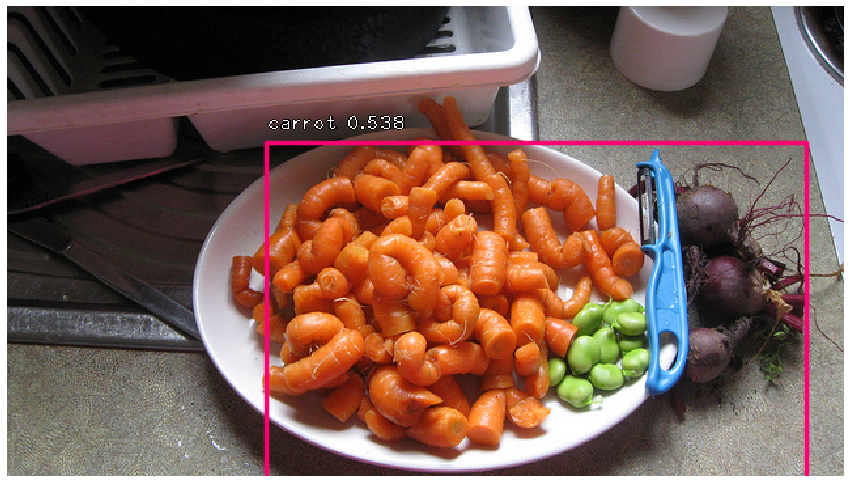

Processing time per image -2:  2.64746356010437


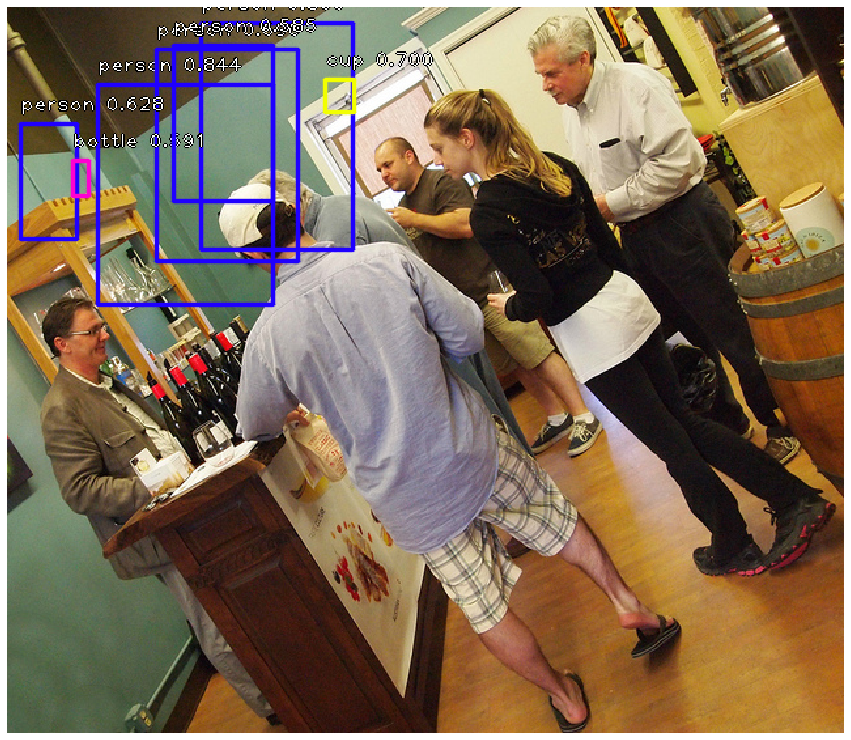

Processing time per image -3:  2.7930405139923096


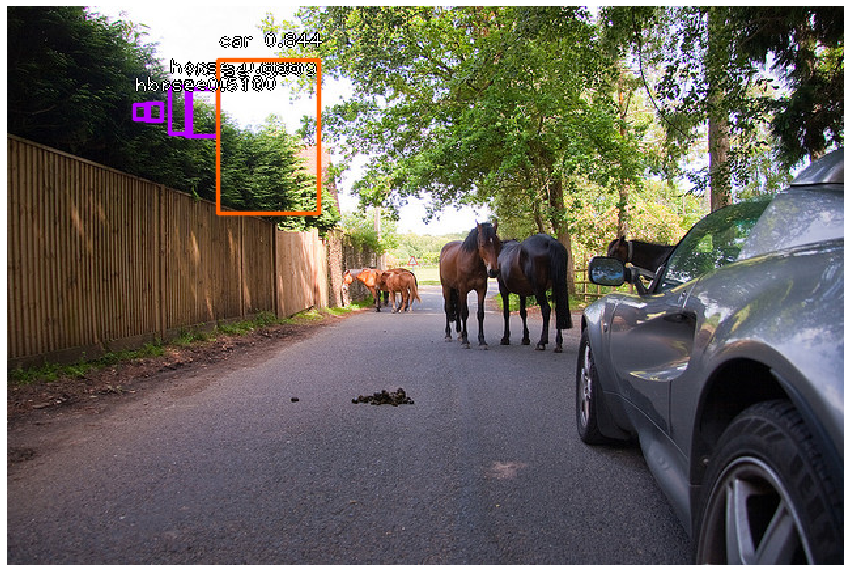

Processing time per image -4:  2.7841365337371826


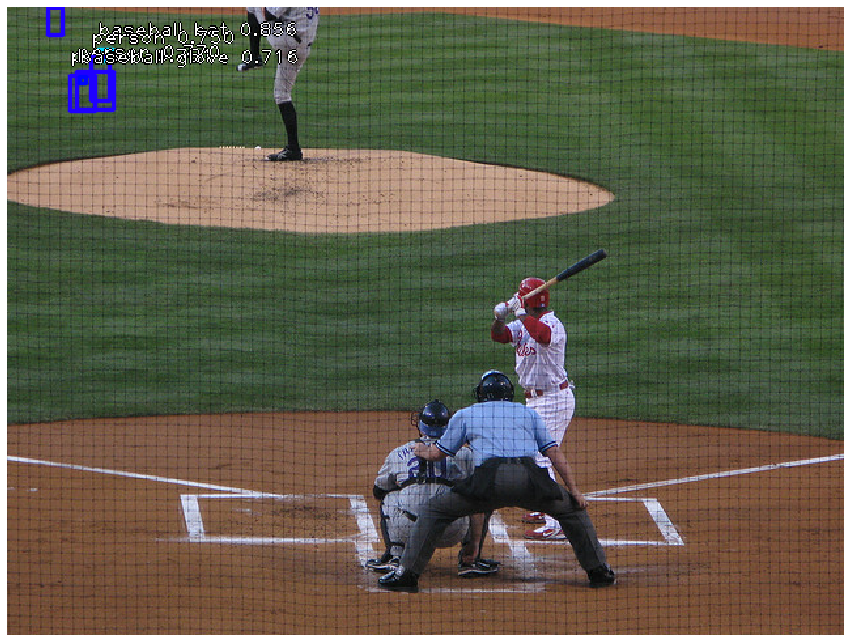

average inference time:  2.646192121505737


In [12]:
TF_MODEL_PATH = 'TRT/tf_model.pb'

graph = tf.Graph()
# warnings.filterwarnings("ignore")
with graph.as_default():
    with tf.Session(config=tf.ConfigProto(gpu_options=tf.GPUOptions(per_process_gpu_memory_fraction=0.50))) as sess:
        # read TensorRT model
        trt_graph = read_pb_graph(TF_MODEL_PATH)

        # obtain the corresponding input-output tensor
        tf.import_graph_def(trt_graph, name='')
        input = sess.graph.get_tensor_by_name('input_1:0')
        boxes = sess.graph.get_tensor_by_name('filtered_detections/map/TensorArrayStack/TensorArrayGatherV3:0')
        scores= sess.graph.get_tensor_by_name('filtered_detections/map/TensorArrayStack_1/TensorArrayGatherV3:0')
        labels= sess.graph.get_tensor_by_name('filtered_detections/map/TensorArrayStack_2/TensorArrayGatherV3:0')
        
        # in this case, it demonstrates to perform inference for 50 times
        total_time = 0; n_time_inference = len(paths)
        for i in range(n_time_inference):
            img = []
            # load image
            path = paths[i]
            image = read_image_bgr(path)

            # copy to draw on
            draw = image.copy()
            draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

            # preprocess image for network
            image = preprocess_image(image)
            image, scale = resize_image(image)
            img.append(image)
            t1 = time.time()
            boxes_P, scores_P, labels_P = sess.run([boxes, scores, labels], feed_dict={input: img})
            t2 = time.time()
            boxes /= scale
            delta_time = t2 - t1
            total_time += delta_time
            print("Processing time per image -" + str(i) + ": ", delta_time)
            
            for box, score, label in zip(boxes_P[0], scores_P[0], labels_P[0]):
                # scores are sorted so we can break
                if score < 0.5:
                    break
        
                color = label_color(label)
    
                b = box.astype(int)
                draw_box(draw, b, color=color)
    
                caption = "{} {:.3f}".format(labels_to_names[label], score)
                draw_caption(draw, b, caption)
            plt.figure(figsize=(15, 15))
            plt.axis('off')
            plt.imshow(draw)
            plt.show()
            
            
        avg_time_tensorflow = total_time / n_time_inference
        print("average inference time: ", avg_time_tensorflow)

Processing time per image -0:  3.5750551223754883


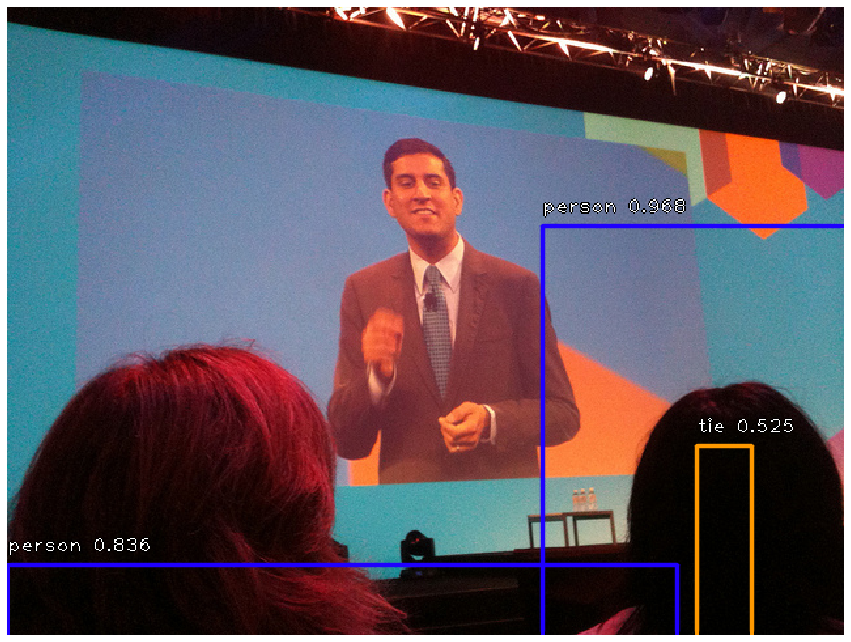

Processing time per image -1:  3.9871768951416016


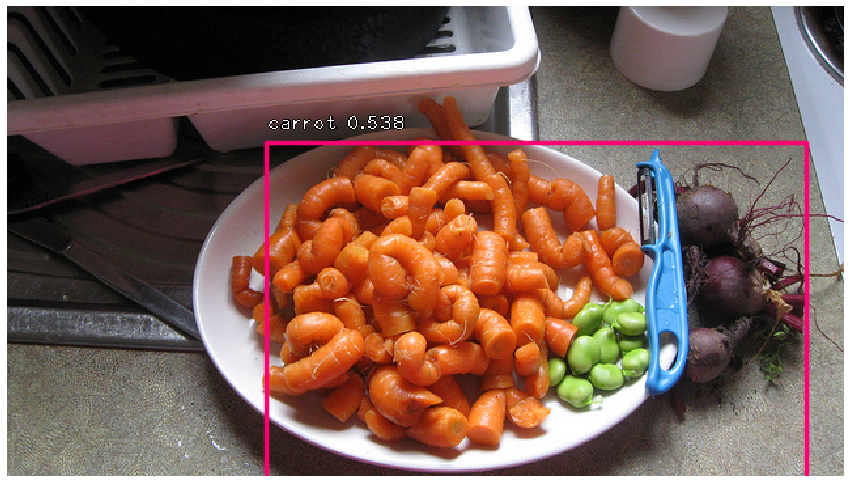

Processing time per image -2:  4.186022996902466


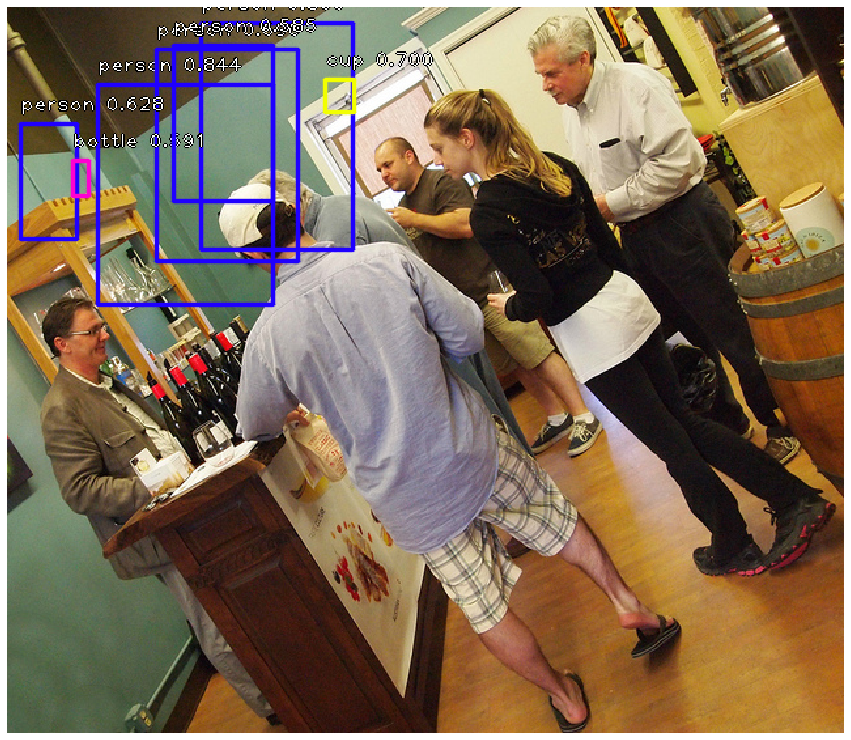

Processing time per image -3:  4.434501647949219


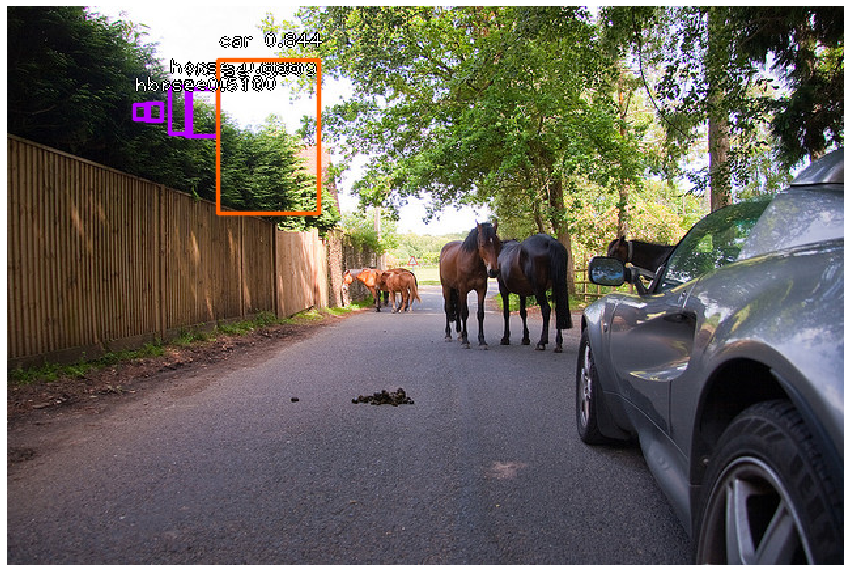

Processing time per image -4:  4.398099660873413


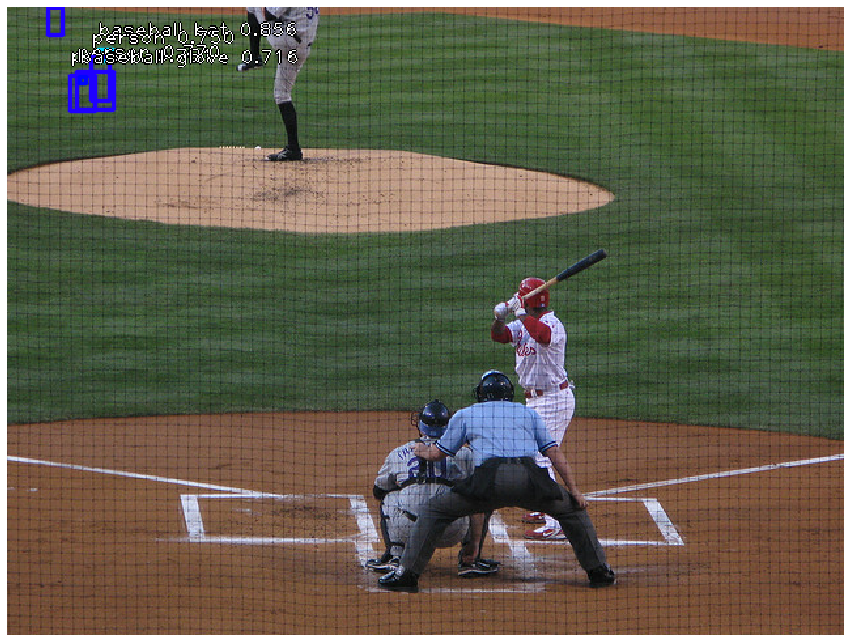

average inference time in FP32:  4.116171264648438


In [10]:
TF_MODEL_PATH = 'TRT/TensorRT_model_16.pb'

graph = tf.Graph()
# warnings.filterwarnings("ignore")
with graph.as_default():
    with tf.Session(config=tf.ConfigProto(gpu_options=tf.GPUOptions(per_process_gpu_memory_fraction=0.50))) as sess:
        # read TensorRT model
        trt_graph = read_pb_graph(TF_MODEL_PATH)

        # obtain the corresponding input-output tensor
        tf.import_graph_def(trt_graph, name='')
        input = sess.graph.get_tensor_by_name('input_1:0')
        boxes = sess.graph.get_tensor_by_name('filtered_detections/map/TensorArrayStack/TensorArrayGatherV3:0')
        scores= sess.graph.get_tensor_by_name('filtered_detections/map/TensorArrayStack_1/TensorArrayGatherV3:0')
        labels= sess.graph.get_tensor_by_name('filtered_detections/map/TensorArrayStack_2/TensorArrayGatherV3:0')
        
        # in this case, it demonstrates to perform inference for 50 times
        total_time = 0; n_time_inference = len(paths)
        for i in range(n_time_inference):
            img = []
            # load image
            path = paths[i]
            image = read_image_bgr(path)

            # copy to draw on
            draw = image.copy()
            draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

            # preprocess image for network
            image = preprocess_image(image)
            image, scale = resize_image(image)
            img.append(image)
            t1 = time.time()
            boxes_P, scores_P, labels_P = sess.run([boxes, scores, labels], feed_dict={input: img})
            t2 = time.time()
            boxes /= scale
            delta_time = t2 - t1
            total_time += delta_time
            print("Processing time per image -" + str(i) + ": ", delta_time)
            
            for box, score, label in zip(boxes_P[0], scores_P[0], labels_P[0]):
                # scores are sorted so we can break
                if score < 0.5:
                    break
        
                color = label_color(label)
    
                b = box.astype(int)
                draw_box(draw, b, color=color)
    
                caption = "{} {:.3f}".format(labels_to_names[label], score)
                draw_caption(draw, b, caption)
            plt.figure(figsize=(15, 15))
            plt.axis('off')
            plt.imshow(draw)
            plt.show()
            
            
        avg_time_tensorRT = total_time / n_time_inference
        print("average inference time in FP32: ", avg_time_tensorRT)